# Get the Data

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [3]:
train = pd.read_csv('/kaggle/input/fi-optimun-frecuency/merged_2.csv', sep=';')
train.columns

Index(['Sample', 'Frequency (GHz)', 'LG (mV)', 'HG (mV)', 'Thickness (mm)'], dtype='object')

Samples has serveral Thickness

In [4]:
train['Thickness (mm)'].value_counts().index.sort_values().tolist()

[0.0, 0.04, 0.07, 0.1, 0.2, 0.29, 0.36, 0.57, 1.85, 2.05, 2.25, 3.0]

51 frecuencies (Ghz)

In [5]:
train['Frequency (GHz)'].value_counts().index.sort_values()

Index([100.0, 110.0, 120.0, 130.0, 140.0, 150.0, 160.0, 170.0, 180.0, 190.0,
       200.0, 210.0, 220.0, 230.0, 240.0, 250.0, 260.0, 270.0, 280.0, 290.0,
       300.0, 310.0, 320.0, 330.0, 340.0, 350.0, 360.0, 370.0, 380.0, 390.0,
       400.0, 410.0, 420.0, 430.0, 440.0, 450.0, 460.0, 470.0, 480.0, 490.0,
       500.0, 510.0, 520.0, 530.0, 540.0, 550.0, 560.0, 570.0, 580.0, 590.0,
       600.0],
      dtype='float64', name='Frequency (GHz)')

15 types of plastic

In [6]:
train['Sample'].value_counts().index.sort_values()

Index(['A1', 'B1', 'C1', 'D1', 'E1', 'F1', 'G1', 'H1', 'I1', 'J1', 'K1', 'L1',
       'M1', 'N1', 'REF'],
      dtype='object', name='Sample')

## Convert the data to a format you can easily manipulate

Remove `Thickness (mm)`

In [7]:
train = train.rename(columns = {'Sample':'target'})
train = pd.concat([train[['Frequency (GHz)', 'LG (mV)', 'HG (mV)']],train[['target']]], axis=1)
train.head()

,Frequency (GHz),LG (mV),HG (mV),target
0,100.0,-7.080942,-0.854611,A1
1,100.0,67.024785,0.244141,A1
2,100.0,124.893178,-1.098776,A1
3,100.0,91.075571,0.000000,A1
4,100.0,48.956174,0.122094,A1


## Sample a test set, put it aside, and never look at it
The test set is used after the model has been fully trained to assess the model's performance on completely unseen data

Data is split in a stratified fashion, using this at  theTarget as  class labels  
**Conjecture**: It is assumed that there is time independence in the laser measurement..

In [8]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(train, test_size=0.2, random_state=42, stratify=train.target)


Check the target distribution of target in a plotted bar. The frequency or proportion are uniform in train and test dataset

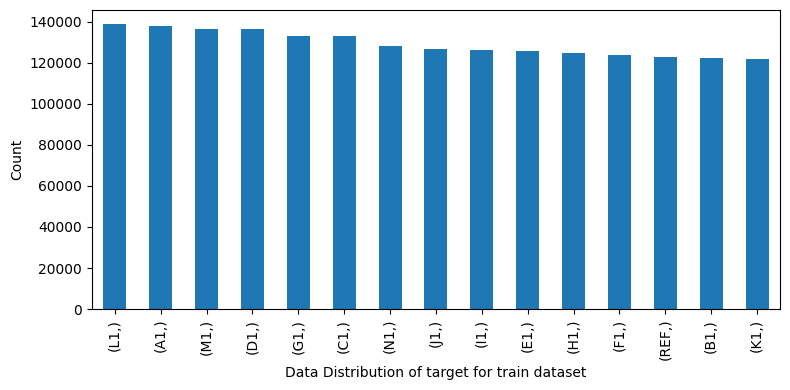

In [9]:
import matplotlib.pylab as plt
ax = train_set[['target']].value_counts().transpose().plot.bar(figsize=(8, 4), legend=False)
ax.set_xlabel('Data Distribution of target for train dataset')
ax.set_ylabel('Count')
plt.tight_layout()
plt.show()

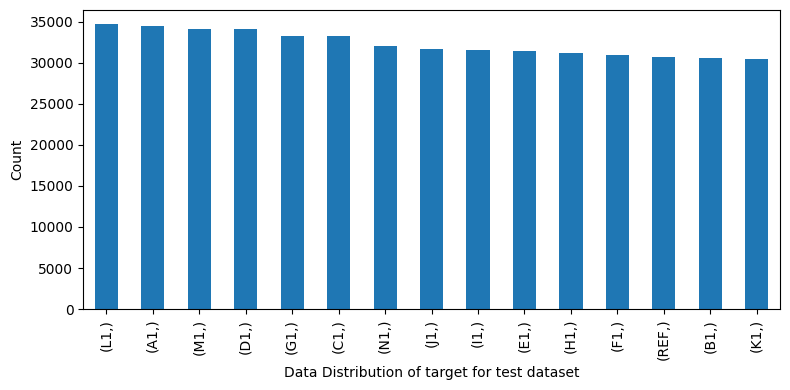

In [10]:
ax = test_set[['target']].value_counts().transpose().plot.bar(figsize=(8, 4), legend=False)
ax.set_xlabel('Data Distribution of target for test dataset')
ax.set_ylabel('Count')
plt.tight_layout()
plt.show()

 # Explore the data

In [11]:
train_ex = train_set.copy()
train_ex.head()

,Frequency (GHz),LG (mV),HG (mV),target
1125297,560.0,1.220852,39.067268,G1
2316280,260.0,6.836772,-0.244164,REF
10093,130.0,33.207178,-0.244141,A1
206305,210.0,13.307288,-0.122023,B1
2031157,390.0,0.488341,633.622336,M1


## Visualize Data distributions
Knowledge of various sampling and data generating distributions allows us to quantify potential errors in an estimate that might be due to random variation.

In [12]:
train_ex = train_ex.rename(columns = {'Frequency (GHz)':'freq'})
train_ex = train_ex.astype({"freq": int,})
train_ex.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1936500 entries, 1125297 to 2139800
Data columns (total 4 columns):
 #   Column   Dtype  
---  ------   -----  
 0   freq     int64  
 1   LG (mV)  float64
 2   HG (mV)  float64
 3   target   object 
dtypes: float64(2), int64(1), object(1)
memory usage: 73.9+ MB


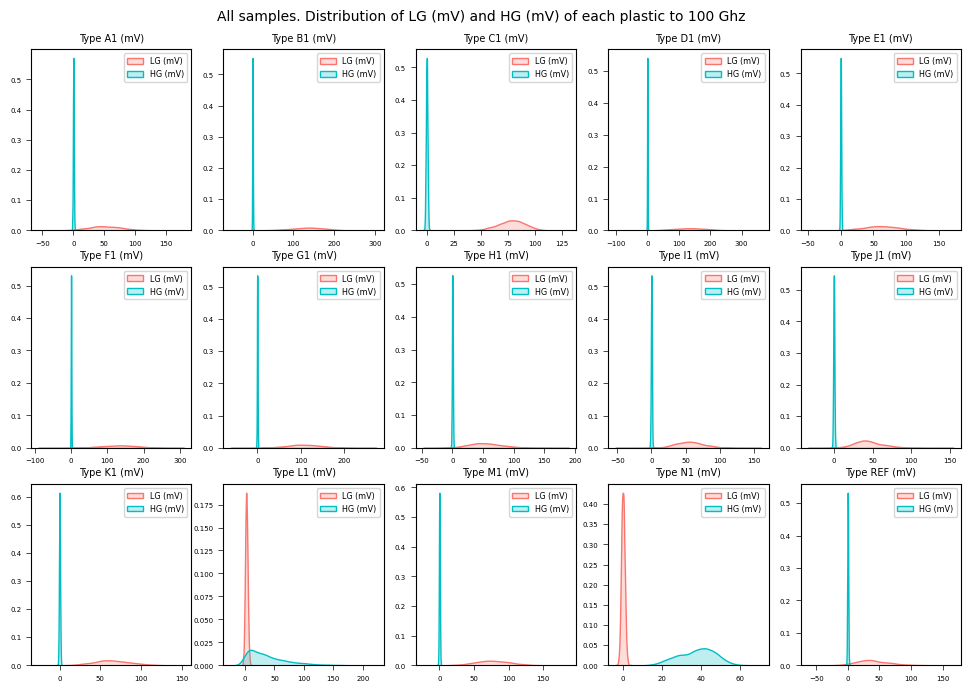

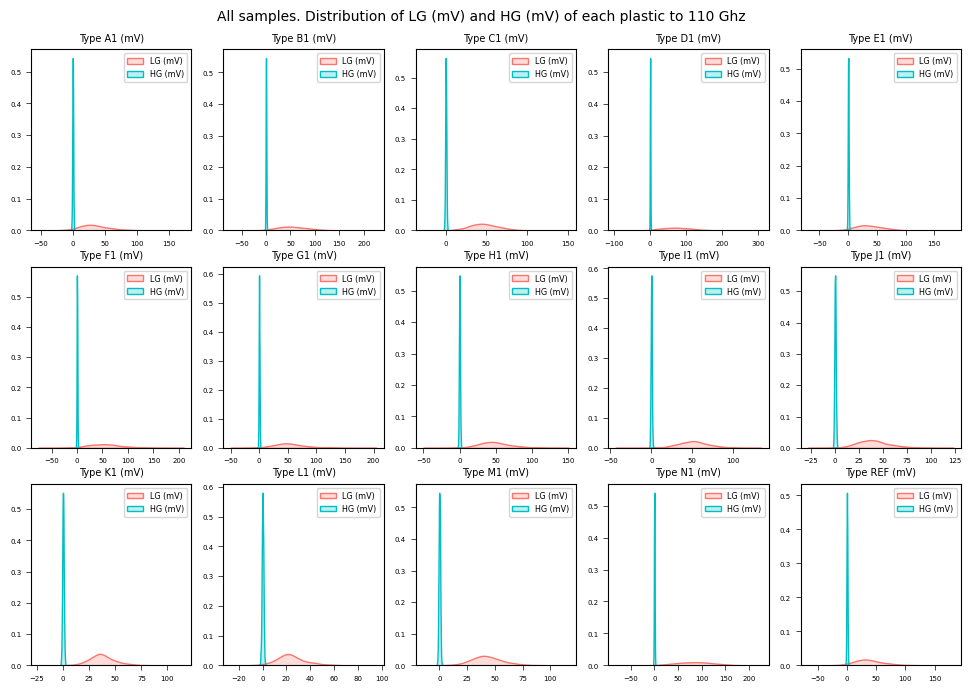

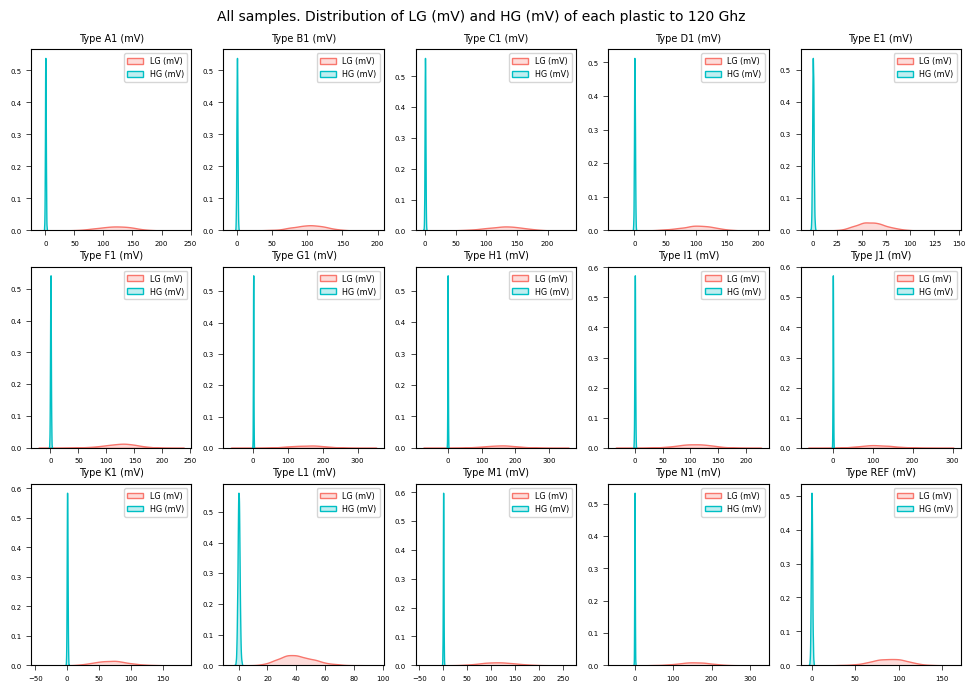

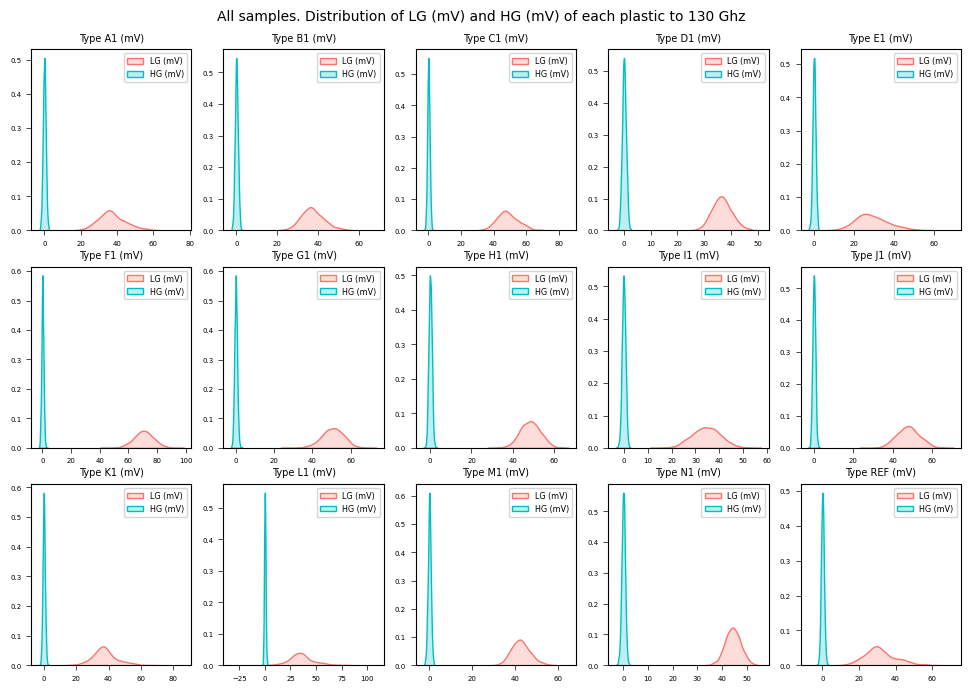

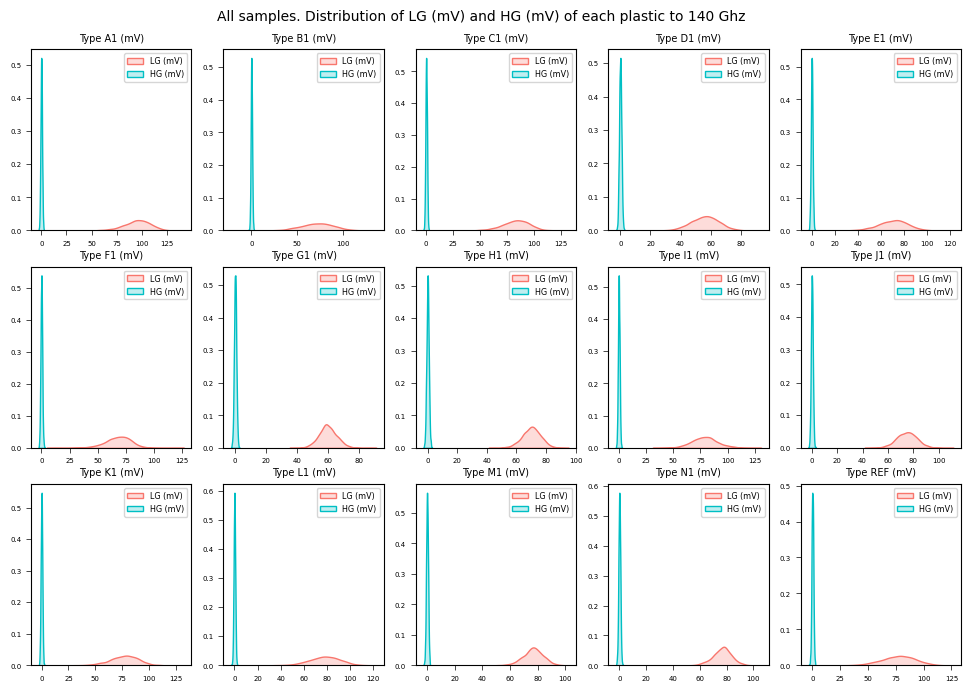

...

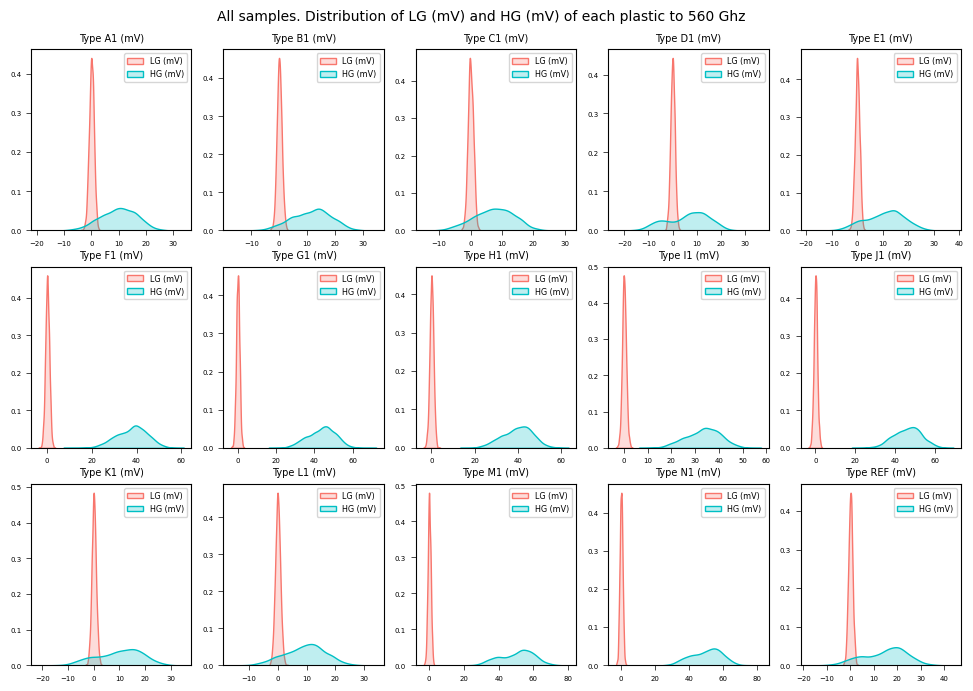

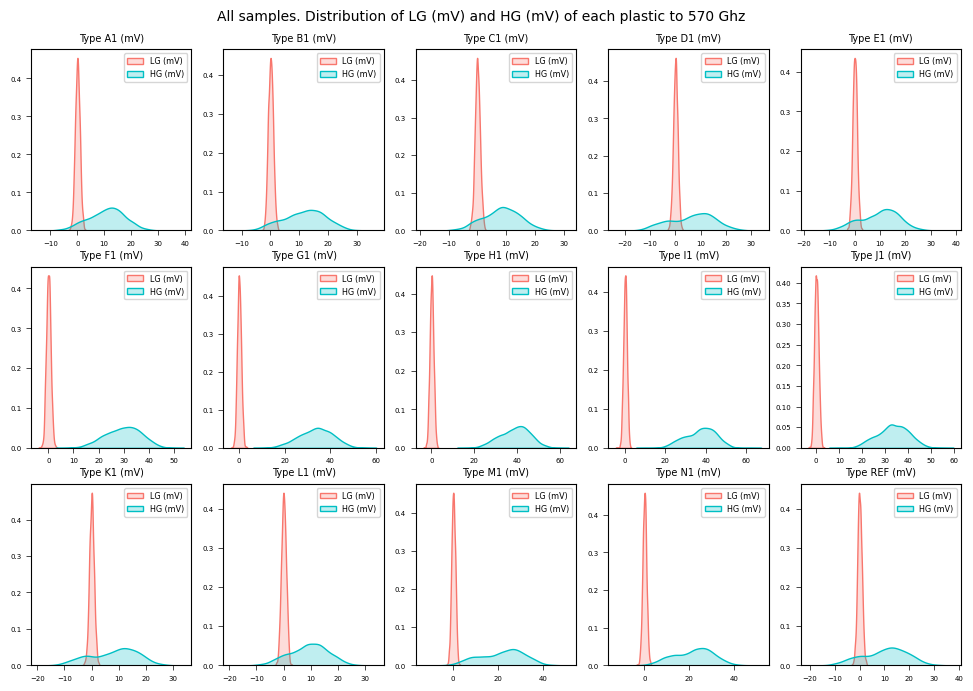

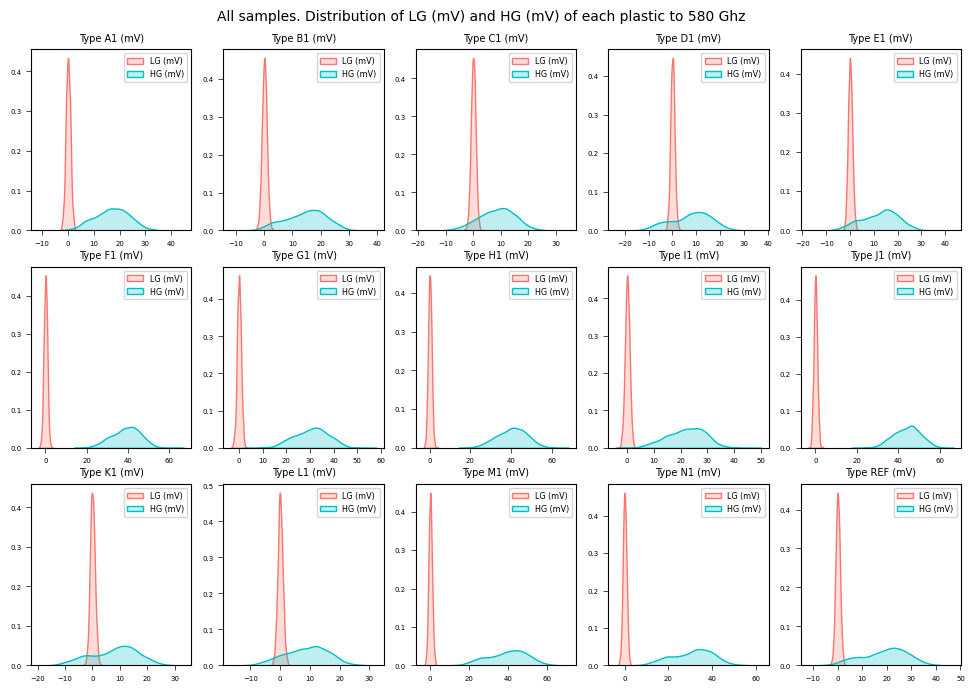

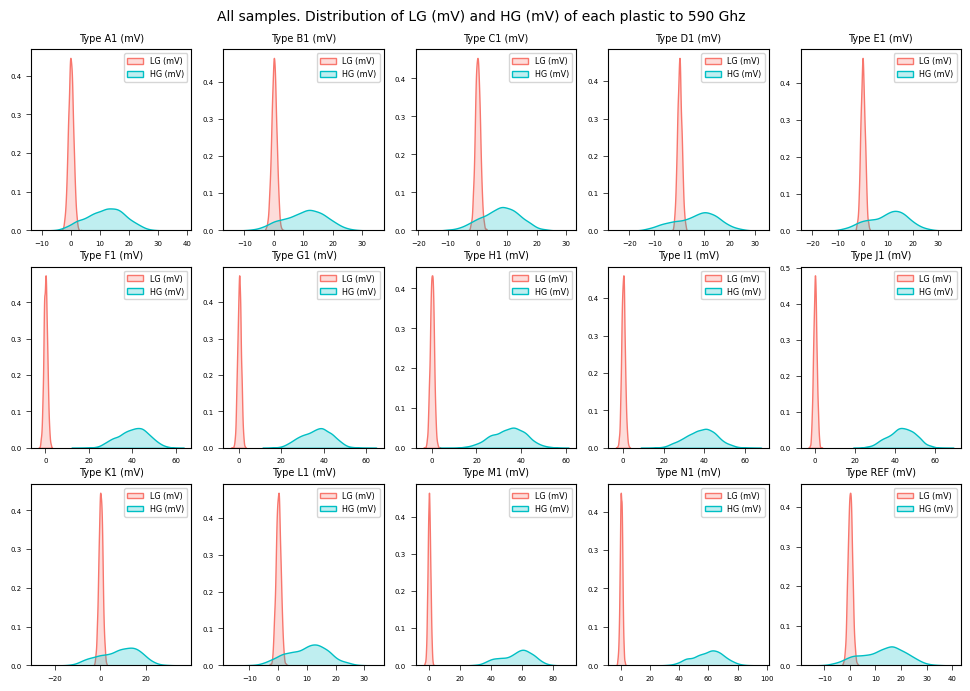

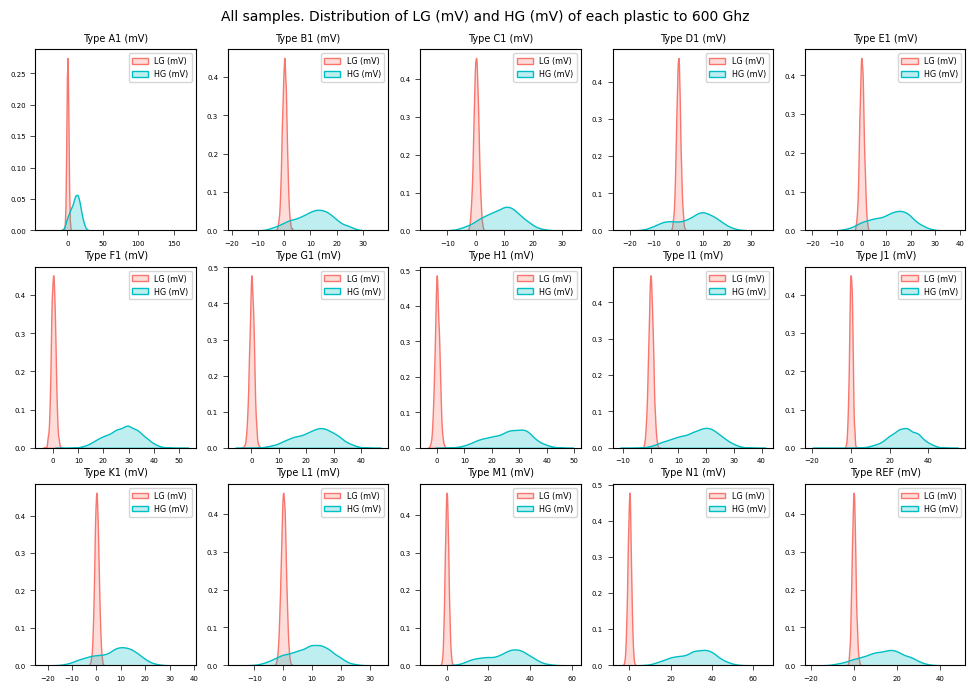

In [13]:
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

for f in train_ex['freq'].value_counts().index.sort_values().tolist():
    freq = f
    ncols = 5
    nrows = 3
    nums_plastics = 0
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
    for r in range(nrows):
        for c in range (ncols):
            t = train_ex['target'].value_counts().index.sort_values().tolist()
            df_tmp = train_ex[(train_ex.freq == freq) & (train_ex.target == t[nums_plastics])]
            sns.kdeplot(x=df_tmp['LG (mV)'], ax=axes[r, c], color='#F8766D', label='LG (mV)',  fill =True )
            sns.kdeplot(x=df_tmp['HG (mV)'], ax=axes[r, c], color='#00BFC4', label='HG (mV)',  fill =True )
            axes[r ,c].legend(fontsize="xx-small")
            axes[r, c].set_ylabel('')
            axes[r, c].set_xlabel('')
            axes[r, c].set_title(f"Type {t[nums_plastics]} (mV)",fontsize=7)
            axes[r, c].tick_params(labelsize=5, width=0.5)
            axes[r, c].xaxis.offsetText.set_fontsize(6)
            axes[r, c].yaxis.offsetText.set_fontsize(4)
            nums_plastics = nums_plastics +1
    plt.suptitle(f"All samples. Distribution of LG (mV) and HG (mV) of each plastic to {freq} Ghz", y=0.93,fontsize=10)
    plt.show()        

## Study Type of distribution to one frecuency

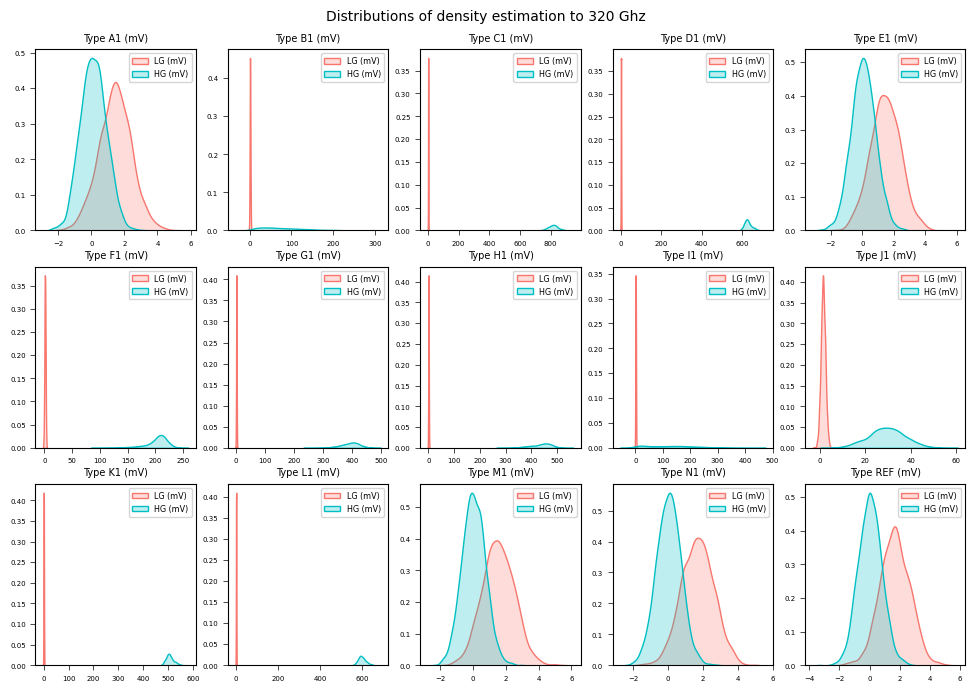

In [14]:
for f in [320]:
    freq = f
    ncols = 5
    nrows = 3
    nums_plastics = 0
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
    for r in range(nrows):
        for c in range (ncols):
            t = train_ex['target'].value_counts().index.sort_values().tolist()
            df_tmp = train_ex[(train_ex.freq == freq) & (train_ex.target == t[nums_plastics])]
            sns.kdeplot(x=df_tmp['LG (mV)'], ax=axes[r, c], color='#F8766D', label='LG (mV)',  fill =True )
            sns.kdeplot(x=df_tmp['HG (mV)'], ax=axes[r, c], color='#00BFC4', label='HG (mV)',  fill =True )
            axes[r, c].legend(fontsize="xx-small")
            axes[r, c].set_ylabel('')
            axes[r, c].set_xlabel('')
            axes[r, c].set_title(f"Type {t[nums_plastics]} (mV)",fontsize=7)
            axes[r, c].tick_params(labelsize=5, width=0.5)
            axes[r, c].xaxis.offsetText.set_fontsize(6)
            axes[r, c].yaxis.offsetText.set_fontsize(4)
            nums_plastics = nums_plastics +1
    plt.suptitle(f"Distributions of density estimation to {freq} Ghz", y=0.93,fontsize=10)
    plt.show()   

#### Summary of the numerical attributes
Compute mean of groups

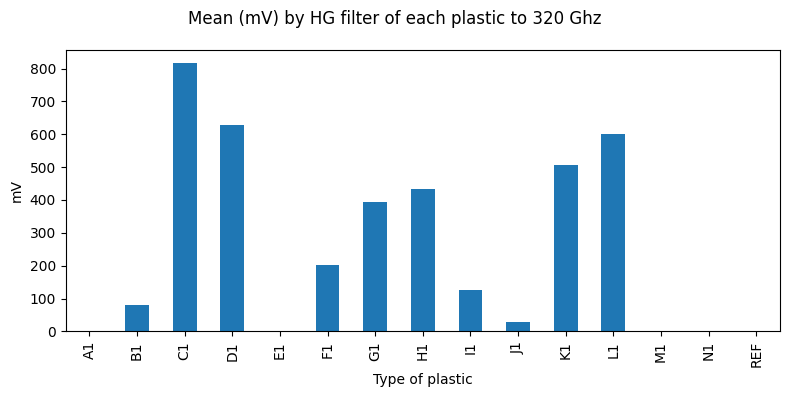

In [15]:

df_tmp = train_ex[(train_ex.freq == freq)]
grouped = df_tmp['HG (mV)'].groupby(df_tmp['target'])

ax = grouped.mean().plot.bar(figsize=(8, 4), legend=False)
plt.suptitle(f'Mean (mV) by HG filter of each plastic to {freq} Ghz')
ax.set_xlabel(f'Type of plastic')
ax.set_ylabel('mV')
plt.tight_layout()
plt.show()


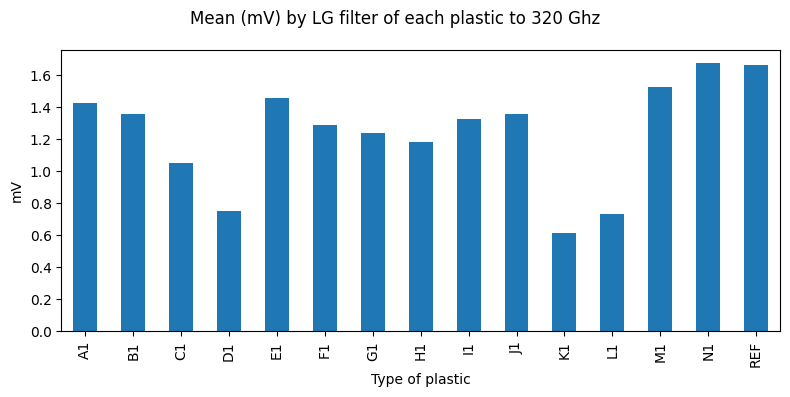

In [16]:

df_tmp = train_ex[(train_ex.freq == freq)]
grouped = df_tmp['LG (mV)'].groupby(df_tmp['target'])

ax = grouped.mean().plot.bar(figsize=(8, 4), legend=False)
plt.suptitle(f'Mean (mV) by LG filter of each plastic to {freq} Ghz')
ax.set_xlabel(f'Type of plastic')
ax.set_ylabel('mV')
plt.tight_layout()
plt.show()


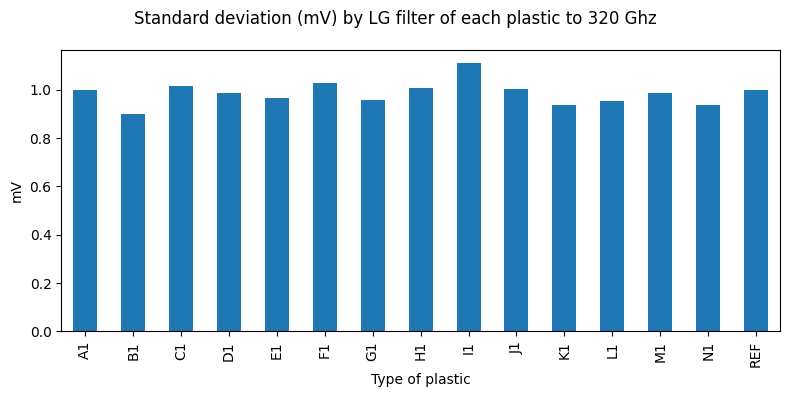

In [17]:
ax = grouped.std().plot.bar(figsize=(8, 4), legend=False)
plt.suptitle(f'Standard deviation (mV) by LG filter of each plastic to {freq} Ghz')
ax.set_xlabel(f'Type of plastic')
ax.set_ylabel('mV')
plt.tight_layout()
plt.show()

**Insights**: Assuming a normal distribution can lead to underestimation of extreme events 

#### Predicts that anamolous measures
The tails of a distribution correspond to the extreme values (small and large). Long tails, and guarding against them, are widely recognized in practical work. Nassim Taleb has proposed the black swan theory, which predicts that anamolous events, such as a stock market crash, are much more likely to occur than would be predicted by the normal distribution. 

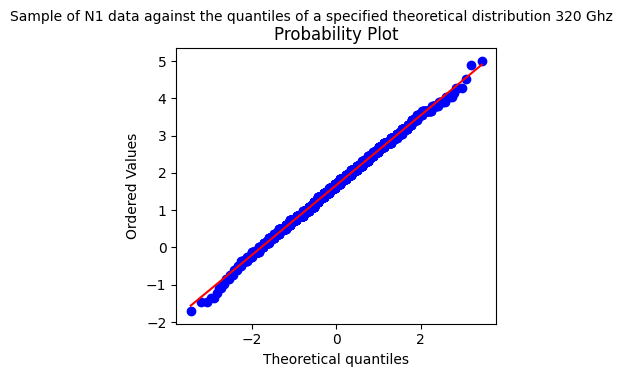

In [18]:
from scipy import stats
temp_t = t[13]
fig, ax = plt.subplots(figsize=(4, 4))
df_tmp = train_ex[(train_ex.freq == freq) & (train_ex.target == temp_t)]
#stats.probplot(df_tmp['LG (mV)'], plot=ax)
stats.probplot(df_tmp['LG (mV)'], plot=ax)

plt.suptitle(f"Sample of {temp_t} data against the quantiles of a specified theoretical distribution {freq} Ghz", y=0.93,fontsize=10)
plt.tight_layout()
plt.show()


**Insights**: The points are far below the line for low values and far 
above the line for high value. Theree are much more likely t 
observe extreme values than would be expected if the data had a norm l
distribution

## Identify the promising transformations you may want to apply
Target variable takes only a limited number of values. Encode target (categorical features) as an integer array.  
**Question**: How does doing this in the previous phase (Convert the data to a format you can easily manipulate) affect the classifier?

In [19]:
from sklearn.preprocessing import OrdinalEncoder
label_train_ex = train_ex.copy()
ordinal_encoder = OrdinalEncoder()
label_train_ex['target'] = ordinal_encoder.fit_transform(train_ex[['target']])

### % of missing values
No missing values in each column of training data

In [20]:
print(label_train_ex.shape)
missing_val_count_by_column = (label_train_ex.isnull().sum())
print(missing_val_count_by_column[missing_val_count_by_column > 0])

(1936500, 4)
Series([], dtype: int64)


### Type of distribution in frecuency
Representation of the distribution of nums of sample by frecuency. 

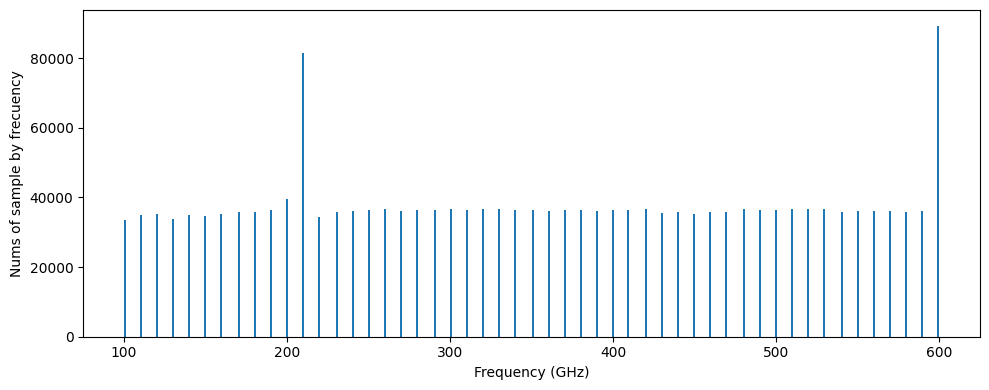

In [21]:
ax = label_train_ex['freq'].plot.hist(figsize=(10, 4), bins=408)
ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Nums of sample by frecuency')
plt.tight_layout()
plt.show()

### Balanced samples of frecuency 

In [22]:
label_train_ex.head()

,freq,LG (mV),HG (mV),target
1125297,560,1.220852,39.067268,6.0
2316280,260,6.836772,-0.244164,14.0
10093,130,33.207178,-0.244141,0.0
206305,210,13.307288,-0.122023,1.0
2031157,390,0.488341,633.622336,12.0


In [23]:
mode = label_train_ex.groupby(['target', 'freq']).size().mode()[0]


**Doubts**: 
* Show 2423 your mode is 2350
* Why use the mode and not min

In [24]:
# Function to reduce samples to the mode value
def reduce_to_mode(df, target, frequency, mode):
    # Filter the DataFrame for the specific sample and frequency
    freq_df = df[(df['target'] == target) & (df['freq'] == frequency)]
    # If the number of samples is greater than the mode, sample down to the mode
    if len(freq_df) > mode:
        return freq_df.sample(n=mode, random_state=42)
    return freq_df

# Apply the function to reduce target for each combination of Sample and Frequency (GHz)
tmp_balanced_data = []
for (target, frequency), group in label_train_ex.groupby(['target', 'freq']):
    tmp_balanced_data.append(reduce_to_mode(label_train_ex, target, frequency, mode))

# Combine the balanced samples into a single DataFrame
balanced_train_ex = pd.concat(tmp_balanced_data)

Check count values within each target and frequency

In [25]:
grouped = balanced_train_ex.groupby(['target', 'freq'])
grouped.count()

LG (mV)  HG (mV)
target freq                  
0.0    100      2173     2173
       110      2192     2192
       120      2423     2423
       130      2413     2413
       140      2423     2423
...              ...      ...
14.0   560      2423     2423
       570      2423     2423
       580      2423     2423
       590      2423     2423
       600      2423     2423

[765 rows x 2 columns]

**Doubts**: 
* There are several targets with samples below of mode, i.e: 100.0 Ghz, 130.0 Ghz. How affect `Thickness (mm)` attribute to study.

 ## Study the correlations between attributes

Encodes target labels with values between 0 and ``n_classes-1, so `A1` are `0`, `B1` are `1`,... and so on all categories

`A1`, `B1`, `C1`, `D1`, `E1`, `E2`, `E3`, `F1`, `G1`, `H1`, `I1`, `J1`, `K1`, `L1`, `M1`, `N1`, `REF`

In [26]:
balanced_train_ex.head()

,freq,LG (mV),HG (mV),target
829,100,56.281285,0.488329,0.0
2337,100,54.938348,-0.244236,0.0
1086,100,79.233307,1.098752,0.0
1333,100,41.997313,-1.587033,0.0
1854,100,62.629715,-0.854588,0.0


It is start to analice PE/tie/EVOH/tie/PE/Adhesivo/PE/tie/EVOH/tie/PE (0.2mm) `A1` category `0`

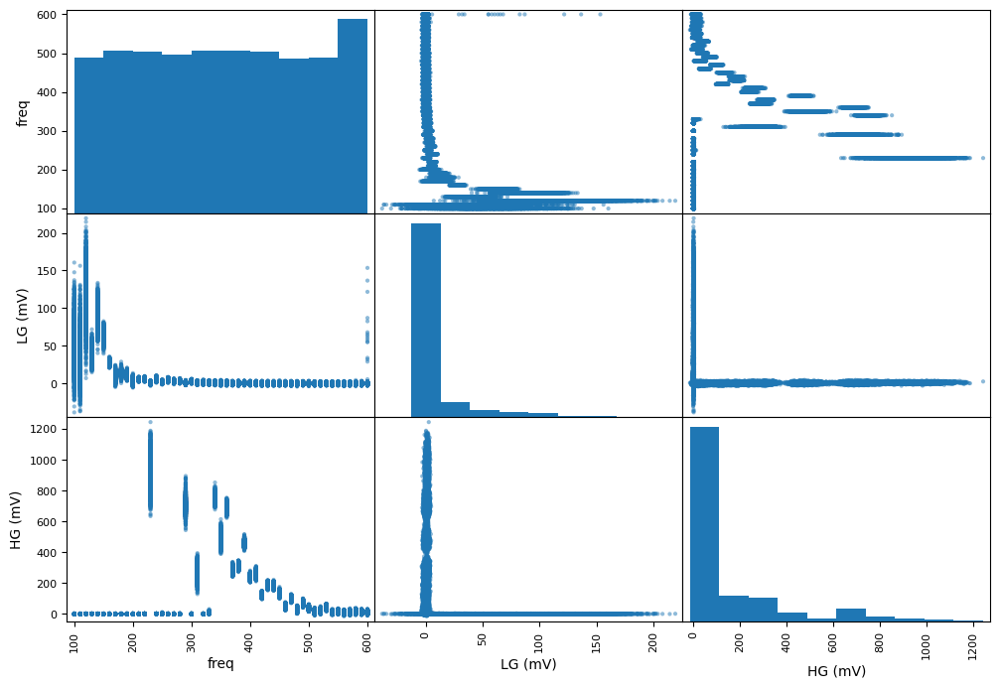

In [27]:
df_tmp = balanced_train_ex[balanced_train_ex.target==0]

from pandas.plotting import scatter_matrix
attributes = ['freq', 'LG (mV)', 'HG (mV)']
ax = scatter_matrix(df_tmp[attributes], figsize=(12, 8))

**Insights**: The correlation coefficient ranges from –1 to 1. When it is close to 1, it means that there is a strong positive correlation; for example, the `HG (mV)` value tends to go up slightly when the `Frequency (GHz)` goes up. When the coefficient is close to –1, it means that there is a strong negative correlation; you can see a big negative correlation between `LG (mV)` and the `Frequency (GHz)` 

**Evidende**: It can be interpreted that to measured plastic PE/tie/EVOH/tie/PE/Adhesivo/PE/tie/EVOH/tie/PE (0.2mm) `A1` category `0` getaworse response to since high frecuencies in the `LG (mV)`. So the measurement obtained in the low-pass filter is lower `LG (mV)` is better to low frecuencies, although it obtains response peaks at 600 GHz that would have to be explained why they occur


7oat64

In [28]:
corr_matrix = df_tmp.corr()
corr_matrix['freq'].sort_values(ascending=False)

freq       1.000000
HG (mV)    0.009245
LG (mV)   -0.556751
target          NaN
Name: freq, dtype: float64

# Prepare the data to better expose the underlying data patterns
## Feature engineering
### Add promising transformations of features

In [29]:
train_pr = balanced_train_ex.copy()
train_pr = train_pr.rename(columns = {'Frequency (GHz)':'freq'})

In [30]:
train_pr = train_pr.astype({"freq": int, "target": int})

#https://stackoverflow.com/questions/43131715/pandas-new-column-by-combining-numbers-of-two-columns-as-strings
train_pr['freq_target'] = train_pr['freq'].astype(str) + train_pr['target'].astype(str)
train_pr['freq_target'].nunique() # train_pr['freq'].nunique() * train_pr['target'].nunique() 765 different measures



765

In [31]:
train_pr['freq_target'] = train_pr['freq_target'].astype(int)
#train_pr = train_pr.rename(columns = {'freq':'Frequency (GHz)'})

train_pr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1813690 entries, 829 to 2417599
Data columns (total 5 columns):
 #   Column       Dtype  
---  ------       -----  
 0   freq         int64  
 1   LG (mV)      float64
 2   HG (mV)      float64
 3   target       int64  
 4   freq_target  int64  
dtypes: float64(2), int64(3)
memory usage: 83.0 MB


**Doubts**: Normalize freq_target?

## Add transformations of features (e.g., log(x), sqrt(x), x^2, etc.).

In [32]:
#train_pr_exp['LG (mV) Exp'] = train_pr['LG (mV)'].apply(np.exp)
#train_pr_exp['HG (mV) Exp'] = train_pr['HG (mV)'].apply(np.exp)
#train_pr_exp.head()

#### Aggregate features into promising new features

In [33]:
#Find out if zeros before to Aggregate features
df_temp = train_pr.rename(columns={'LG (mV)': 'LG_mV','HG (mV)': 'HG_mV' })
df_temp[df_temp.LG_mV==0] # 55657 zeros
df_temp[df_temp.HG_mV==0] # 15316 zeros

,freq,LG_mV,HG_mV,target,freq_target
493,100,12.330607,0.0,0,1000
572,100,28.079599,0.0,0,1000
2189,100,42.241484,0.0,0,1000
523,100,42.241485,0.0,0,1000
1965,100,56.159200,0.0,0,1000
...,...,...,...,...,...
2417156,600,-0.610426,0.0,14,60014
2418877,600,0.976682,0.0,14,60014
2420265,600,0.244170,0.0,14,60014
2419934,600,0.488341,0.0,14,60014


In [34]:
train_pr.nsmallest(5,'LG (mV)') # -68.367724	
train_pr.nsmallest(5,'HG (mV)') # -21.731168
train_pr.nlargest(5,'LG (mV)') # 326.822124	
train_pr.nlargest(5,'HG (mV)') # 1244.658768


,freq,LG (mV),HG (mV),target,freq_target
53994,230,2.685875,1244.658768,0,2300
52862,230,0.244170,1188.621712,0,2300
535521,230,1.342937,1187.400806,3,2303
53347,230,0.366256,1183.860338,0,2300
1981802,230,0.488341,1181.174457,12,23012


Slide all values to remove zeros and Aggregate features into promising new features

In [35]:
train_pr['LG (mV)_shifted'] = train_pr['LG (mV)'].apply(lambda x: np.sum([x, 100]))
train_pr['HG (mV)_shifted'] = train_pr['HG (mV)'].apply(lambda x: np.sum([x, 100]))
train_pr['HG_div_LG'] = train_pr['HG (mV)_shifted']/train_pr['LG (mV)_shifted']
train_pr.head()

,freq,LG (mV),HG (mV),target,freq_target,LG (mV)_shifted,HG (mV)_shifted,HG_div_LG
829,100,56.281285,0.488329,0,1000,156.281285,100.488329,0.642997
2337,100,54.938348,-0.244236,0,1000,154.938348,99.755764,0.643842
1086,100,79.233307,1.098752,0,1000,179.233307,101.098752,0.564062
1333,100,41.997313,-1.587033,0,1000,141.997313,98.412967,0.693062
1854,100,62.629715,-0.854588,0,1000,162.629715,99.145412,0.609639


In [36]:
train_pr.nsmallest(5,'HG_div_LG') # 0.232934
train_pr.nlargest(5,'HG_div_LG') # 13.094876
train_pr_shifted = train_pr.drop(columns=['LG (mV)_shifted', 'HG (mV)_shifted'])
train_pr_shifted.head()

,freq,LG (mV),HG (mV),target,freq_target,HG_div_LG
829,100,56.281285,0.488329,0,1000,0.642997
2337,100,54.938348,-0.244236,0,1000,0.643842
1086,100,79.233307,1.098752,0,1000,0.564062
1333,100,41.997313,-1.587033,0,1000,0.693062
1854,100,62.629715,-0.854588,0,1000,0.609639


## Feature scaling standardize
Neural networks and SVMs, are very sensitive to the scaling of the data


In [37]:
train_pr.head()

,freq,LG (mV),HG (mV),target,freq_target,LG (mV)_shifted,HG (mV)_shifted,HG_div_LG
829,100,56.281285,0.488329,0,1000,156.281285,100.488329,0.642997
2337,100,54.938348,-0.244236,0,1000,154.938348,99.755764,0.643842
1086,100,79.233307,1.098752,0,1000,179.233307,101.098752,0.564062
1333,100,41.997313,-1.587033,0,1000,141.997313,98.412967,0.693062
1854,100,62.629715,-0.854588,0,1000,162.629715,99.145412,0.609639


In [38]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(train_pr[['LG (mV)','HG (mV)']].to_numpy()) 
X_train_scaled = pd.DataFrame(X_train_scaled,
                              index=train_pr.index.tolist(),
                              columns=['LG (mV) scaled', 'HG (mV) scaled'])
train_pr_scaled = pd.concat([train_pr,X_train_scaled],axis=1).drop(columns=['LG (mV)', 'HG (mV)'])


**Doubt**: Always applies exactly the same transformation to the training and the test set. 

In [39]:
train_pr_scaled.head()

,freq,target,freq_target,LG (mV)_shifted,HG (mV)_shifted,HG_div_LG,LG (mV) scaled,HG (mV) scaled
829,100,0,1000,156.281285,100.488329,0.642997,0.315416,0.017546
2337,100,0,1000,154.938348,99.755764,0.643842,0.312017,0.016967
1086,100,0,1000,179.233307,101.098752,0.564062,0.373494,0.018028
1333,100,0,1000,141.997313,98.412967,0.693062,0.279271,0.015907
1854,100,0,1000,162.629715,99.145412,0.609639,0.331480,0.016485


# Explore different models

Mean (mV) by LG filter of each plastic to 300 Ghz looks a good to classifier

In [40]:
train_mo = train_pr_shifted.copy().rename(columns = {'Frequency (GHz)':'freq'})
train_mo = train_mo.sample(frac=0.05, random_state=1)
train_mo.head()

,freq,LG (mV),HG (mV),target,freq_target,HG_div_LG
1334622,220,4.761323,0.854635,8,2208,0.962709
1081647,410,2.075449,285.923588,6,4106,3.780768
1099242,470,-0.122085,57.380050,6,4706,1.575724
1770792,120,48.223659,-1.220822,11,12011,0.666420
1496902,230,2.197534,630.325967,9,2309,7.146219


The validation set `X_va` and `y_va` is used during the training phase of the model to provide an unbiased evaluation of the model's performance and to fine-tune the model's parameters.

In [41]:
train_ex_orig = train_ex.copy()
train_ex = train_mo.copy().drop(columns=['freq_target'])
train_ex.info()

<class 'pandas.core.frame.DataFrame'>
Index: 90684 entries, 1334622 to 1061067
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   freq       90684 non-null  int64  
 1   LG (mV)    90684 non-null  float64
 2   HG (mV)    90684 non-null  float64
 3   target     90684 non-null  int64  
 4   HG_div_LG  90684 non-null  float64
dtypes: float64(3), int64(2)
memory usage: 4.2 MB


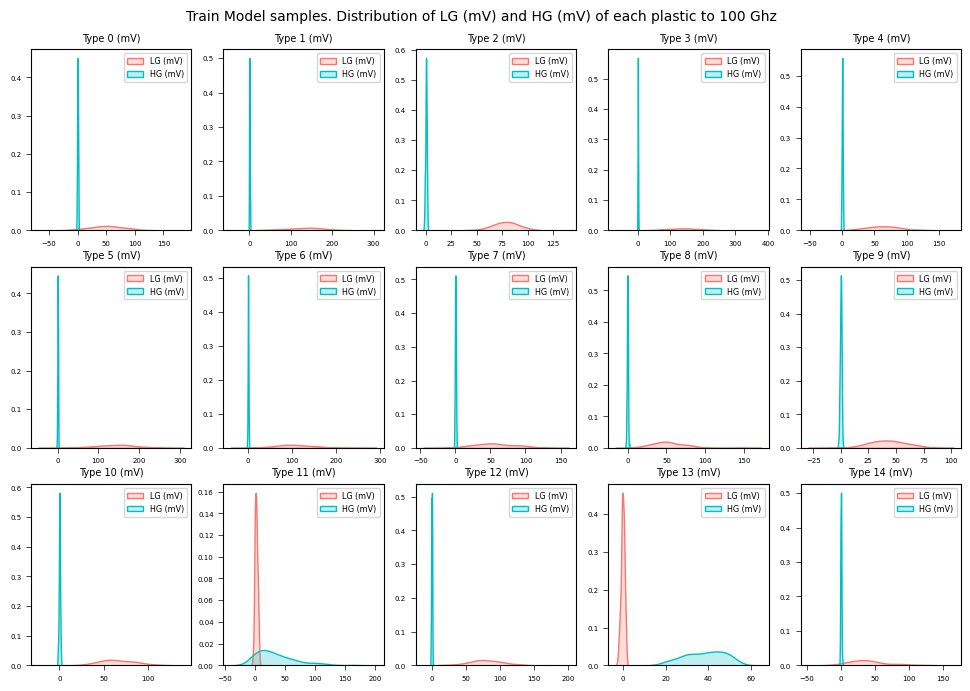

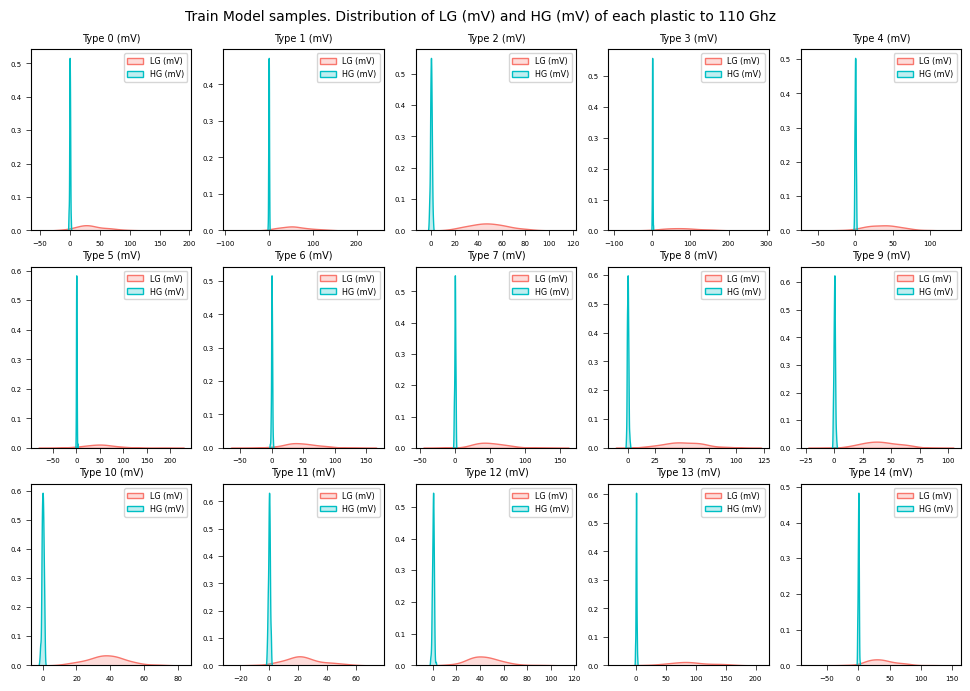

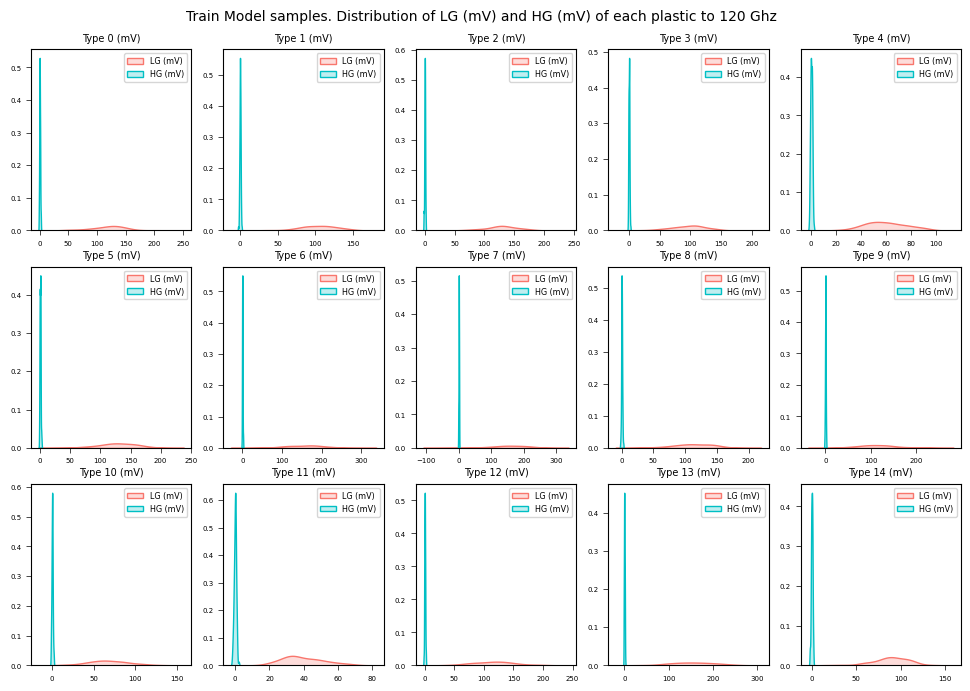

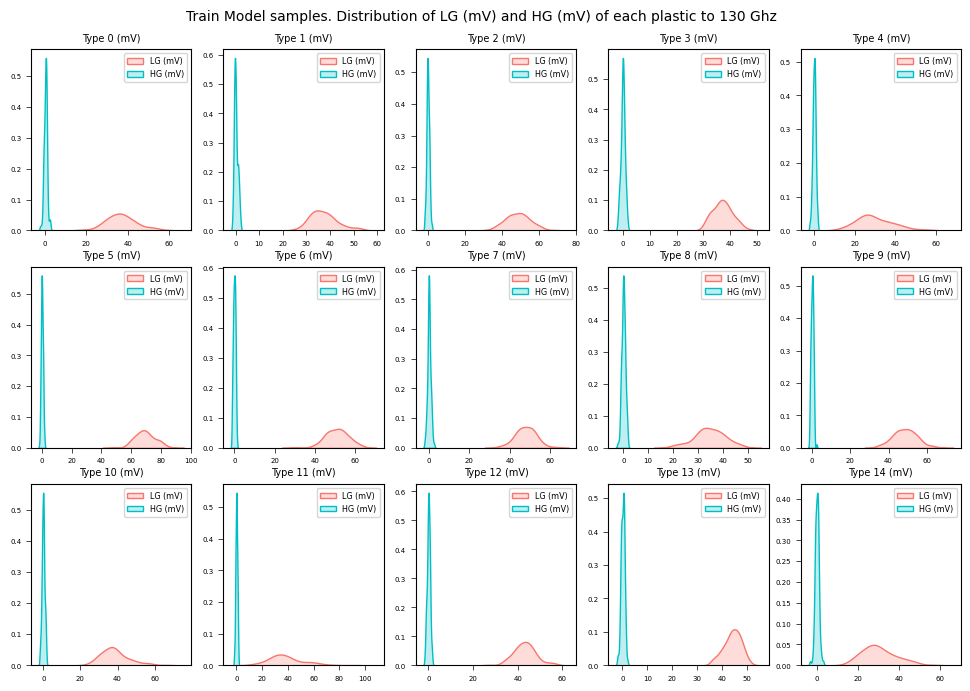

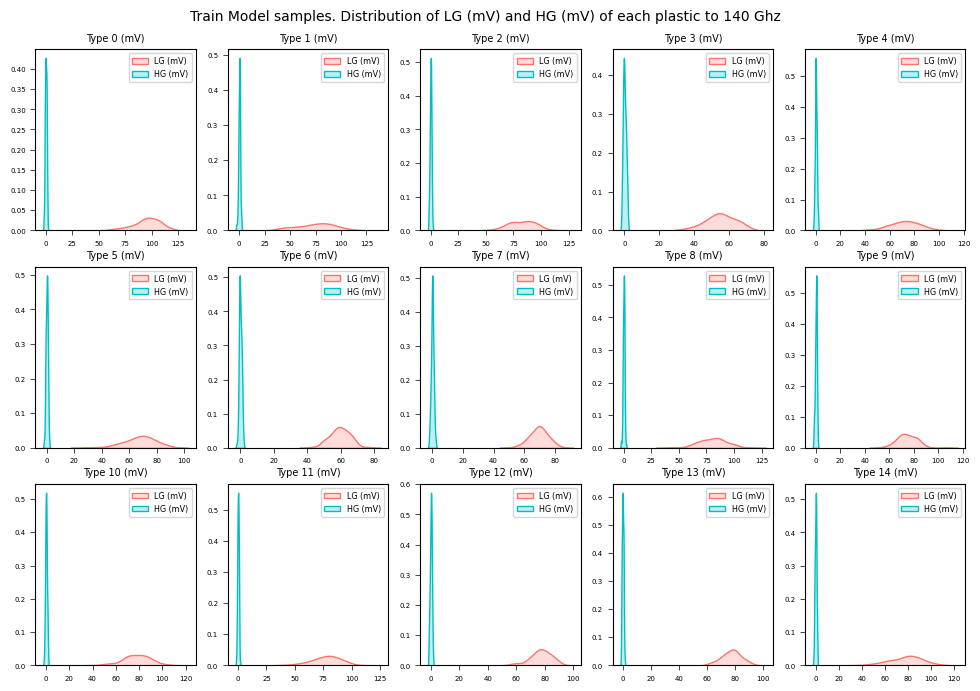

...

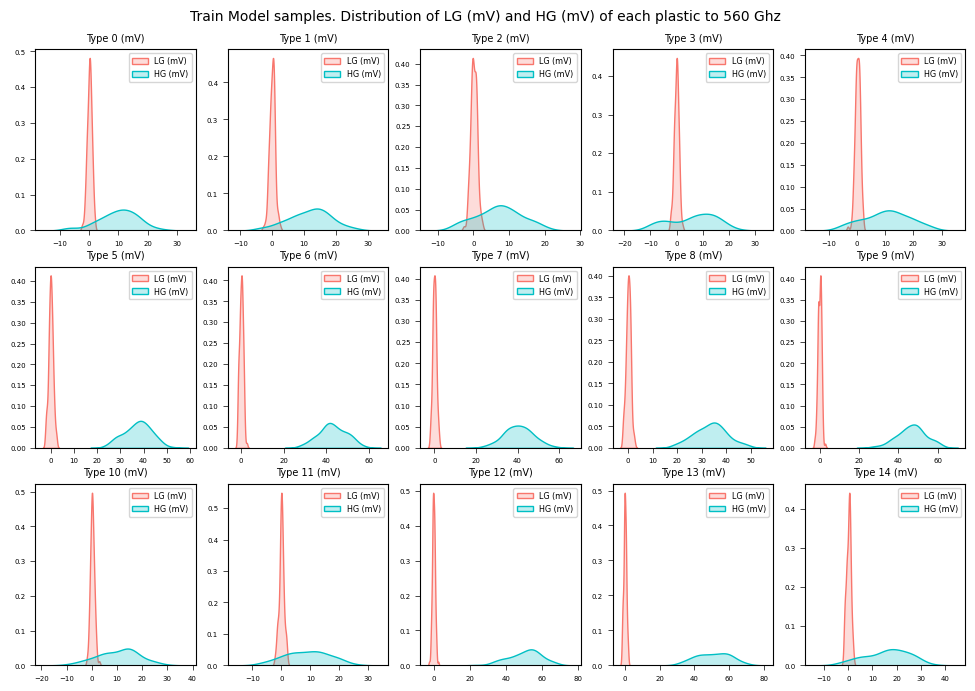

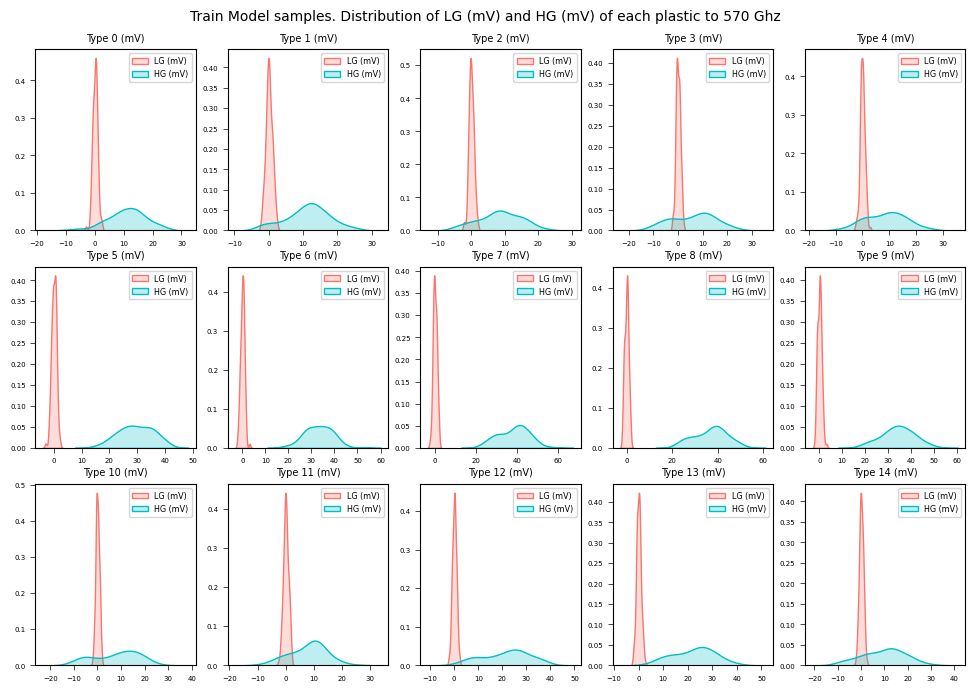

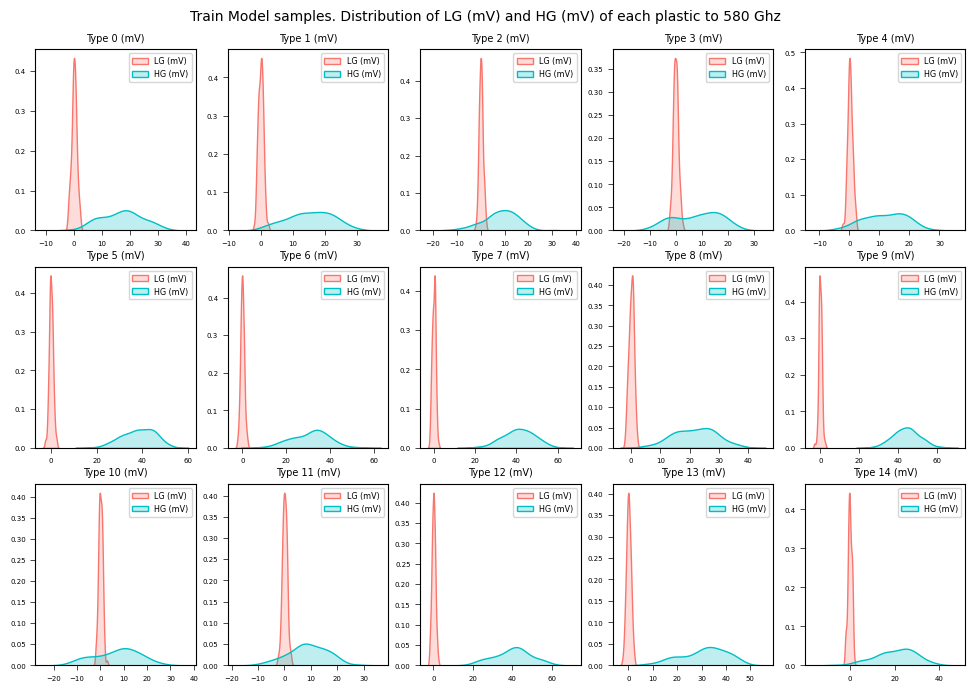

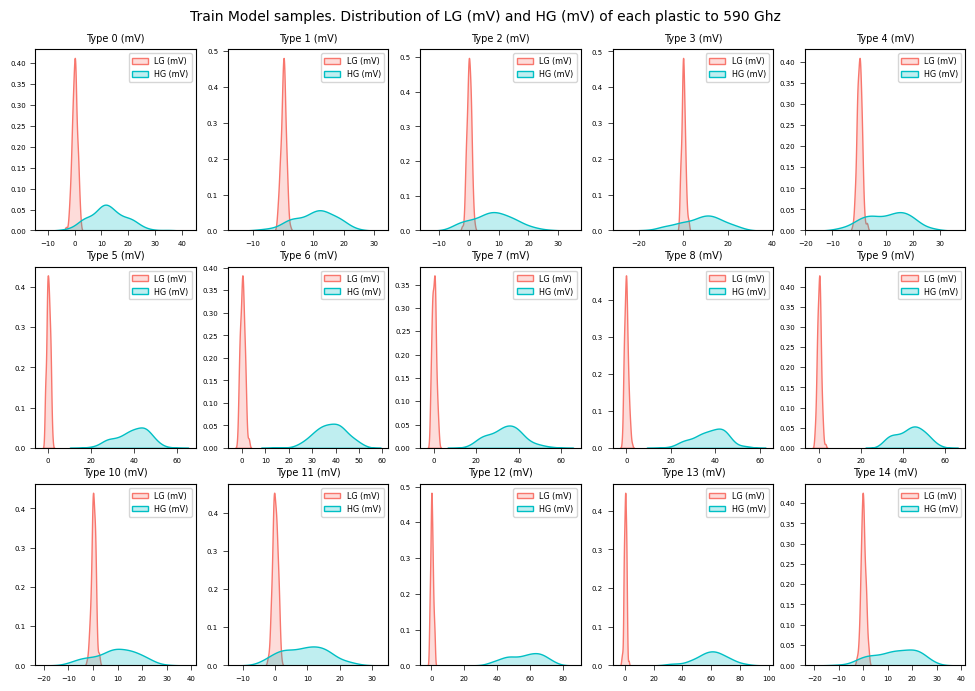

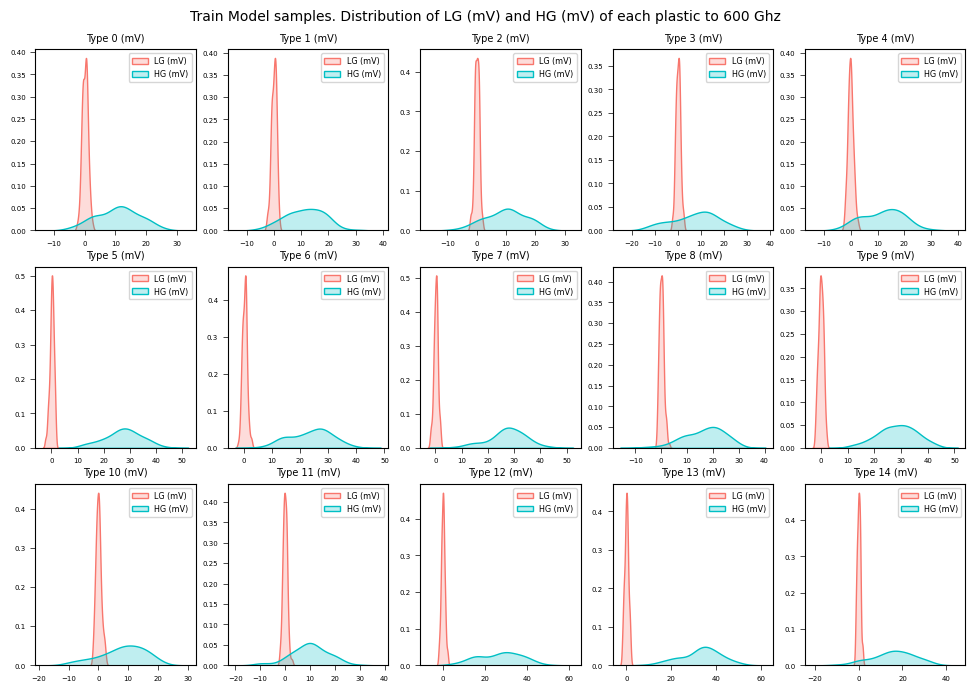

In [42]:
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

for f in train_ex['freq'].value_counts().index.sort_values().tolist():
    freq = f
    ncols = 5
    nrows = 3
    nums_plastics = 0
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
    for r in range(nrows):
        for c in range (ncols):
            t = train_ex['target'].value_counts().index.sort_values().tolist()
            df_tmp = train_ex[(train_ex.freq == freq) & (train_ex.target == t[nums_plastics])]
            sns.kdeplot(x=df_tmp['LG (mV)'], ax=axes[r, c], color='#F8766D', label='LG (mV)',  fill =True )
            sns.kdeplot(x=df_tmp['HG (mV)'], ax=axes[r, c], color='#00BFC4', label='HG (mV)',  fill =True )
            axes[r ,c].legend(fontsize="xx-small")
            axes[r, c].set_ylabel('')
            axes[r, c].set_xlabel('')
            axes[r, c].set_title(f"Type {t[nums_plastics]} (mV)",fontsize=7)
            axes[r, c].tick_params(labelsize=5, width=0.5)
            axes[r, c].xaxis.offsetText.set_fontsize(6)
            axes[r, c].yaxis.offsetText.set_fontsize(4)
            nums_plastics = nums_plastics +1
    plt.suptitle(f"Train Model samples. Distribution of LG (mV) and HG (mV) of each plastic to {freq} Ghz", y=0.93,fontsize=10)
    plt.show()        

In [43]:
train_ex = train_ex_orig.copy()
del train_ex_orig

In [44]:
from sklearn.model_selection import train_test_split
train_set, validate_set = train_test_split(train_mo, test_size=0.2, random_state=42)

y_tr = train_set.target
y_va = validate_set[['target']]

X_tr = train_set.drop(columns=['target'])
X_va = validate_set.drop(columns=['target'])
train_mo.head()

,freq,LG (mV),HG (mV),target,freq_target,HG_div_LG
1334622,220,4.761323,0.854635,8,2208,0.962709
1081647,410,2.075449,285.923588,6,4106,3.780768
1099242,470,-0.122085,57.380050,6,4706,1.575724
1770792,120,48.223659,-1.220822,11,12011,0.666420
1496902,230,2.197534,630.325967,9,2309,7.146219


**Cojeture**: Look samples are homogenius

In [45]:
grouped = validate_set.groupby(['target', 'freq'])
grouped.count()['freq_target']

target  freq
0       100     17
        110     20
        120     23
        130     16
        140     20
                ..
14      560     26
        570     27
        580     35
        590     26
        600     37
Name: freq_target, Length: 765, dtype: int64

In [46]:
X_va_freq_target = X_va.copy()
X_tr, X_va = X_tr.drop(columns=['freq_target']), X_va.drop(columns=['freq_target'])
X_tr.head()

,freq,LG (mV),HG (mV),HG_div_LG
1428899,540,2.075449,32.108411,1.294223
891860,340,2.685875,524.966443,6.086197
608056,460,0.122085,25.759980,1.256066
1391470,410,0.610426,209.131956,3.072564
1153432,140,68.611890,-0.610375,0.589458


## Train many quick and dirty models 

In [47]:
import time
start_time = time.time()

In [48]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy="most_frequent").fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = dummy_clf.predict(X_va.to_numpy())

from sklearn.metrics import accuracy_score
dummy_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [49]:
from sklearn.linear_model import LogisticRegression
logit_clf = LogisticRegression().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = logit_clf.predict(X_va.to_numpy())
logit_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [50]:
from sklearn.linear_model import SGDClassifier
sgd_clf = SGDClassifier().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = sgd_clf.predict(X_va.to_numpy())
sgd_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [51]:
from sklearn.svm import SVC
svc_clf = SVC().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = svc_clf.predict(X_va.to_numpy())
svc_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [52]:
X_tr_scaled =  pd.merge(X_tr, train_pr_scaled[['LG (mV) scaled', 'HG (mV) scaled']],
                        right_index=True, left_index=True).drop(columns=['LG (mV)','HG (mV)']) 
X_va_scaled =  pd.merge(X_va, train_pr_scaled[['LG (mV) scaled', 'HG (mV) scaled']],
                        right_index=True, left_index=True).drop(columns=['LG (mV)', 'HG (mV)'])

In [53]:

svc_clf = SVC().fit(X_tr_scaled.to_numpy(), y_tr.to_numpy())
y_pred = svc_clf.predict(X_va_scaled.to_numpy())
svc_score_scaled = accuracy_score(y_va.target.to_numpy(), y_pred)

In [54]:
bayes_score=0
from sklearn.naive_bayes import MultinomialNB
#bayes_clf = MultinomialNB().fit(X_tr.to_numpy(), y_tr.to_numpy())
#bayes_score = accuracy_score(y_va.target.to_numpy(), y_pred)

# ValueError: Negative values in data passed to MultinomialNB (input X)

In [55]:
from sklearn.linear_model import RidgeClassifier
ridge_clf = RidgeClassifier().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = ridge_clf.predict(X_va.to_numpy())
ridge_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [56]:
from sklearn.neighbors import KNeighborsClassifier
neigh_clf = KNeighborsClassifier().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = neigh_clf.predict(X_va.to_numpy())
neigh_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [57]:
from sklearn.tree import DecisionTreeClassifier
tree_clf = DecisionTreeClassifier().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = tree_clf.predict(X_va.to_numpy())
tree_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [58]:
from sklearn.ensemble import RandomForestClassifier
rnd_clf = RandomForestClassifier().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = rnd_clf.predict(X_va.to_numpy())
rnd_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [59]:
from sklearn.ensemble import GradientBoostingClassifier
gb_clf = GradientBoostingClassifier().fit(X_tr.to_numpy(), y_tr.to_numpy())
y_pred = gb_clf.predict(X_va.to_numpy())
gb_score = accuracy_score(y_va.target.to_numpy(), y_pred)

In [60]:
run_time = time.time() - start_time
print(f"Run Time: {run_time:.2f}s")


Run Time: 1264.58s


In [61]:

lst_accuracy_score = [bayes_score, dummy_score, gb_score, logit_score, neigh_score, ridge_score, rnd_score, sgd_score, svc_score, svc_score_scaled, tree_score]
lst_name_clf = ['bayes', 'dummy', 'gb', 'logit', 'neigh', 'ridge', 'rnd', 'sgd', 'svc', 'svc_scaled', 'tree' ]


df_scores = pd.DataFrame({
"name_clf" : lst_name_clf,
"accuracy_score" : lst_accuracy_score
})

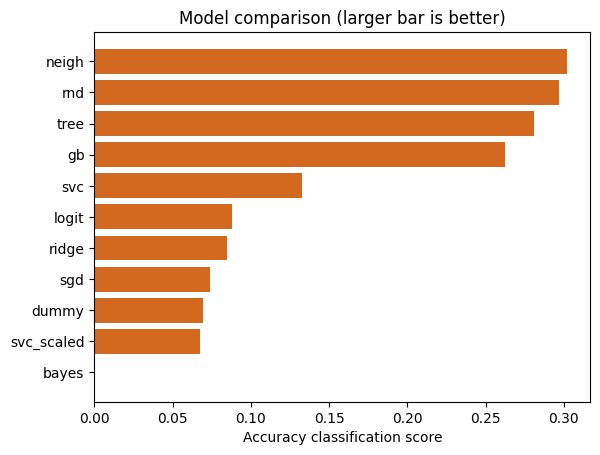

In [62]:
df_scores.sort_values('accuracy_score', ascending=True, inplace=True)
plt.barh(np.arange(len(lst_name_clf)), df_scores.accuracy_score, color='chocolate')
plt.yticks(np.arange(len(lst_name_clf)), df_scores.name_clf)
#plt.xlim(0, 1.2)
plt.title('Model comparison (larger bar is better)')
plt.xlabel('Accuracy classification score')
plt.show()

## Analyze the types of errors the models make
Study best classifier to best frequency

In [63]:
train_mo = train_pr_shifted.copy().rename(columns = {'Frequency (GHz)':'freq'})
train_mo_350 = train_mo[train_mo.freq == 350].drop(columns=['freq_target']) 
train_mo_350.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35909 entries, 90105 to 2342769
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   freq       35909 non-null  int64  
 1   LG (mV)    35909 non-null  float64
 2   HG (mV)    35909 non-null  float64
 3   target     35909 non-null  int64  
 4   HG_div_LG  35909 non-null  float64
dtypes: float64(3), int64(2)
memory usage: 1.6 MB


In [64]:
train_mo_350['exp(HG)'] = train_mo_350['HG (mV)'].apply(lambda x: np.expm1(x/1000))
train_mo_350.head()

,freq,LG (mV),HG (mV),target,HG_div_LG,exp(HG)
90105,350,0.000000,493.346369,0,5.933464,0.637788
91814,350,1.098767,435.355866,0,5.295375,0.545513
89467,350,0.732511,517.763376,0,6.132711,0.678270
89521,350,2.807960,512.513721,0,5.957843,0.669483
88939,350,0.244170,529.361486,0,6.278285,0.697848


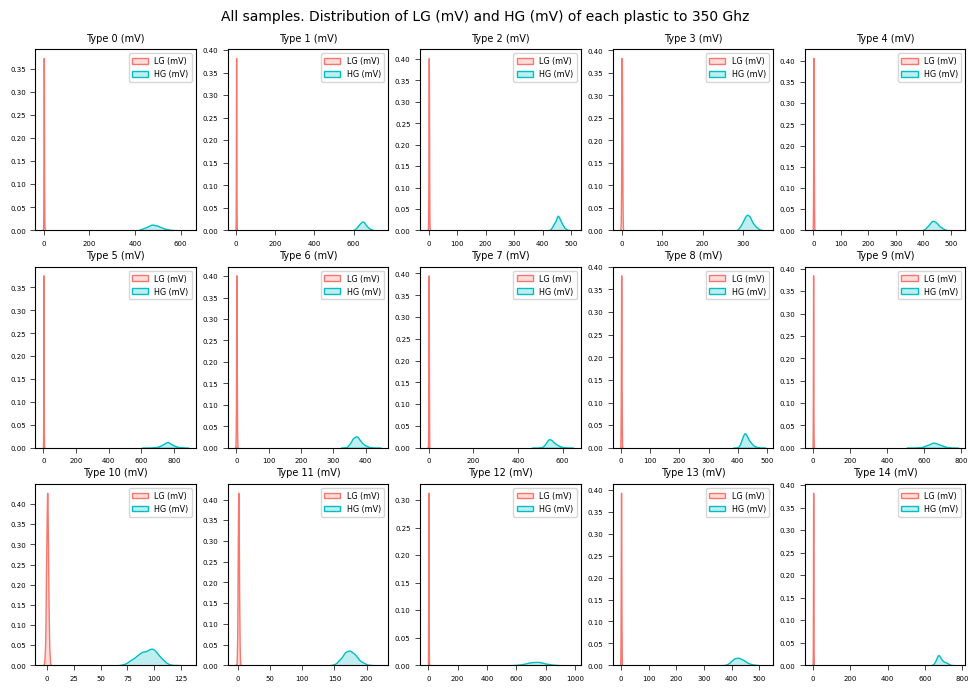

In [65]:
warnings.filterwarnings('ignore')
freq = 350
ncols = 5
nrows = 3
nums_plastics = 0

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
for r in range(nrows):
    for c in range (ncols):
        t = train_mo_350['target'].value_counts().index.sort_values().tolist()
        df_tmp = train_mo_350[(train_mo_350.freq == freq) & (train_mo_350.target == t[nums_plastics])]
        sns.kdeplot(x=df_tmp['LG (mV)'], ax=axes[r, c], color='#F8766D', label='LG (mV)',  fill =True )
        sns.kdeplot(x=df_tmp['HG (mV)'], ax=axes[r, c], color='#00BFC4', label='HG (mV)',  fill =True )
        axes[r ,c].legend(fontsize="xx-small")
        axes[r, c].set_ylabel('')
        axes[r, c].set_xlabel('')
        axes[r, c].set_title(f"Type {t[nums_plastics]} (mV)",fontsize=7)
        axes[r, c].tick_params(labelsize=5, width=0.5)
        axes[r, c].xaxis.offsetText.set_fontsize(6)
        axes[r, c].yaxis.offsetText.set_fontsize(4)
        nums_plastics = nums_plastics +1
plt.suptitle(f"All samples. Distribution of LG (mV) and HG (mV) of each plastic to {freq} Ghz", y=0.93,fontsize=10)
plt.show()   

In [66]:
train_set_350, validate_set_350 = train_test_split(train_mo_350, test_size=0.2, random_state=42)

y_tr_350 = train_set_350.target
y_va_350 = validate_set_350[['target']]

X_tr_350 = train_set_350.drop(columns=['target'])
X_va_350 = validate_set_350.drop(columns=['target'])
X_tr_350.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28727 entries, 572746 to 1063879
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   freq       28727 non-null  int64  
 1   LG (mV)    28727 non-null  float64
 2   HG (mV)    28727 non-null  float64
 3   HG_div_LG  28727 non-null  float64
 4   exp(HG)    28727 non-null  float64
dtypes: float64(4), int64(1)
memory usage: 1.3 MB


In [67]:
neigh_clf_350 = KNeighborsClassifier().fit(X_tr_350.to_numpy(), y_tr_350.to_numpy())
y_pred_350 = neigh_clf_350.predict(X_va_350.to_numpy())
neigh_score_350 = accuracy_score(y_va_350.target.to_numpy(), y_pred_350) #0.5896686159844055

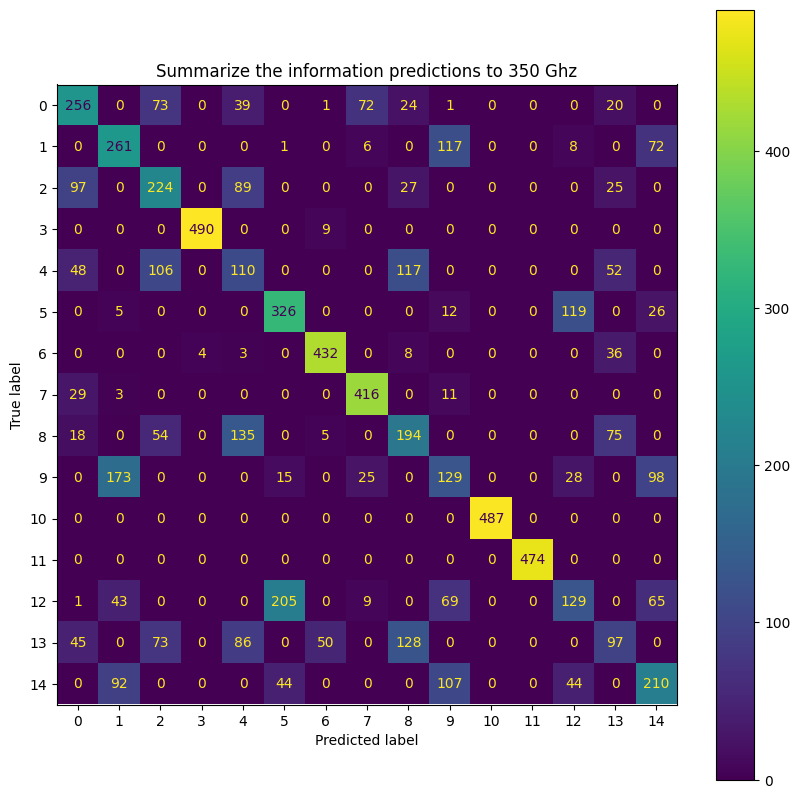

In [68]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_va_350.target.to_numpy(), y_pred_350, labels=neigh_clf_350.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=neigh_clf_350.classes_)
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title('Summarize the information predictions to 350 Ghz')
disp.plot(ax=ax)

# Columns are type produced and rows are type preceved. 

* `Type 0`: 256 samples are produced and perceived well. 97 are perceived like type 2, 48 samples as type 4, and so on
* `Type 1`: 261 samples are produced and perceived well. 173 are perceived like type 9, 43 samples as type 12, and so on
* etc.

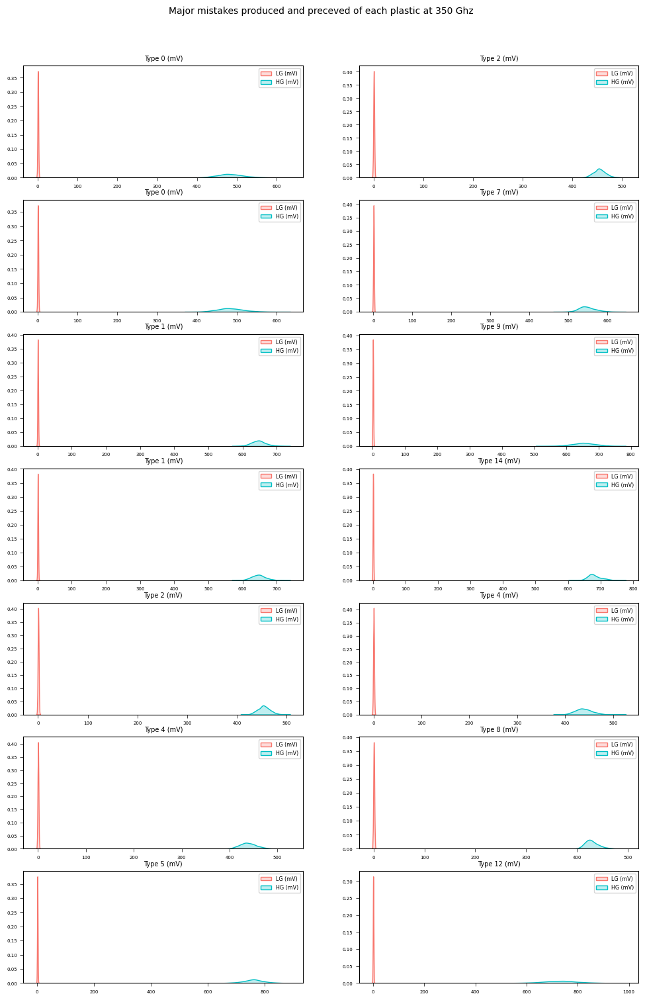

In [69]:
freq = 350
ncols = 2
nrows = 7
i = 0
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 18))
for r in range(nrows):
    for c in range (ncols):
        t = [0, 2, 0, 7, 1, 9, 1, 14, 2, 4, 4, 8, 5, 12, 8, 13, 9, 14, 12, 14]
        df_tmp = train_mo_350[(train_mo_350.freq == freq) & (train_mo_350.target == t[i])]
        sns.kdeplot(x=df_tmp['LG (mV)'], ax=axes[r, c], color='#F8766D', label='LG (mV)',  fill =True )
        sns.kdeplot(x=df_tmp['HG (mV)'], ax=axes[r, c], color='#00BFC4', label='HG (mV)',  fill =True )
        #sns.kdeplot(x=df_tmp['HG (mV)'], ax=axes[r, c], color='#00BFC4', label='HG (mV)x2',  fill =True )
        axes[r ,c].legend(fontsize="xx-small")
        axes[r, c].set_ylabel('')
        axes[r, c].set_xlabel('')
        axes[r, c].set_title(f"Type {t[i]} (mV)",fontsize=7)
        axes[r, c].tick_params(labelsize=5, width=0.5)
        axes[r, c].xaxis.offsetText.set_fontsize(6)
        axes[r, c].yaxis.offsetText.set_fontsize(4)
        i = i + 1
plt.suptitle(f"Major mistakes produced and preceved of each plastic at {freq} Ghz", y=0.93,fontsize=10)
plt.show()   

# Present your solution

## Explain why your solution achieves the objective


In [70]:
train_sol = train_mo.copy()
train_sol.head()

,freq,LG (mV),HG (mV),target,freq_target,HG_div_LG
829,100,56.281285,0.488329,0,1000,0.642997
2337,100,54.938348,-0.244236,0,1000,0.643842
1086,100,79.233307,1.098752,0,1000,0.564062
1333,100,41.997313,-1.587033,0,1000,0.693062
1854,100,62.629715,-0.854588,0,1000,0.609639


**Notice**: Type of plastic are changed by numbers so `A1`, `B1`, `C1`, `D1`, `E1`, `E2`, `E3`, `F1`, `G1`, `H1`, `I1`, `J1`, `K1`, `L1`, `M1`, `N1`, `REF` are `0`, `1`, `2`, `3`, `4`, etc. and so on

In [71]:
lst_target = validate_set['target'].drop_duplicates().sort_values().values.tolist()
#lst_freq = test_set['freq'].drop_duplicates().sort_values().values.tolist()

### Evaluate the accuracy of a classification of the best classificator

In [72]:
y_pred = neigh_clf.predict(X_va.to_numpy())

In [73]:
y_va_sol = y_va.copy() 
y_va_sol['y_pred'] = y_pred 
# df['test'] = np.where(df['crnn_pred']==df['manual_raw_value'], 1, 0)
y_va_sol['true_pred'] = np.where(y_va_sol['y_pred'] == y_va_sol['target'],1,0)
X_va_freq = pd.concat([y_va_sol,X_va_freq_target['freq']], axis=1)
X_va_freq.head()


,target,y_pred,true_pred,freq
1035311,6,1,0,260
2242032,13,5,0,540
1215547,7,6,0,340
1185989,7,2,0,240
1386401,8,6,0,390


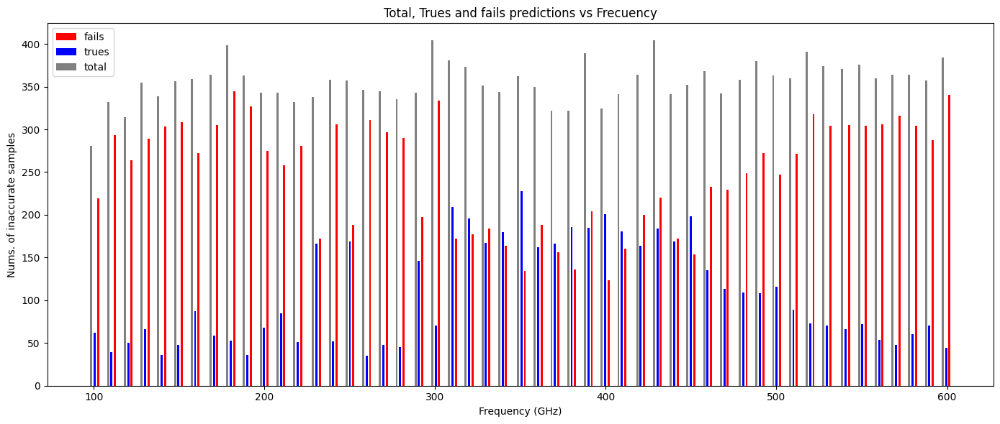

In [74]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 6)
_ = ax.hist(X_va_freq[X_va_freq.true_pred==0]['freq'].apply(lambda x: np.sum([x, +2])).values, bins=408, label="fails", color="red")
_ = ax.hist(X_va_freq[X_va_freq.true_pred==1]['freq'].values, bins=408, label="trues", color="blue")
_ = ax.hist(X_va_freq['freq'].apply(lambda x: np.sum([x, -2])).values, bins=408, label="total", color="gray")
ax.legend()
ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Nums. of inaccurate samples')
ax.set_title('Total, Trues and fails predictions vs Frecuency')
plt.tight_layout()
plt.show()

**Insights** : 
* Central frecuencies have less fails than lower and upper frecuencies
* The frequency with the highest accuracy can now be identified: `350 Ghz`get").

### Count the number of times instances of types of plastics are misclassified

**Code_Fixit**: change 

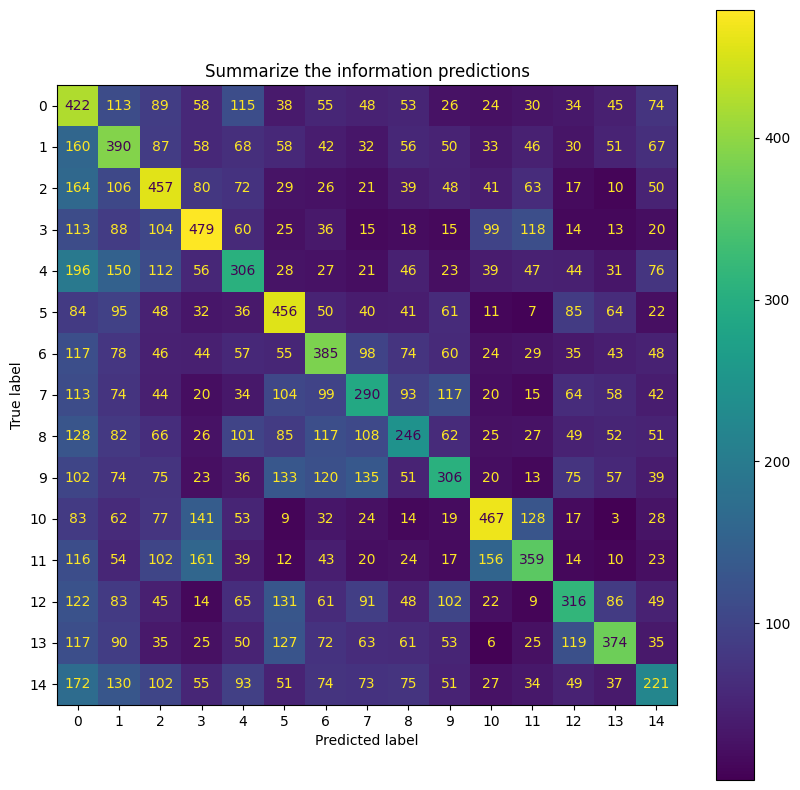

In [75]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_va.target.to_numpy(), y_pred, labels=neigh_clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=neigh_clf.classes_)
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title('Summarize the information predictions')
disp.plot(ax=ax)

**Insights**:
* Count the number of times instances of class `0` (or `A1`) are classified as otherone class `1`, `2` and so on. The first row of this matrix shows 418 (of 1224 samples) were correctly classified and non class 806 (115+89+57+116+38+54+47+53+27+25+30+34+47+74) were wrongly classified. 115 as type 1,  89 as type 2 and so on. 
* Besides, the first columns shows that class `0`  were wrongly classified 1795 (159+170+119+197+85+119+112+127+99+86+119+121+114+168) by other class. He might be the plastic which was most often confused by other plastic.


### Of validate dataset, explore what frecuencies classified by target 

In [76]:
X_va_inaccurate = X_va_freq[X_va_freq.true_pred==0]

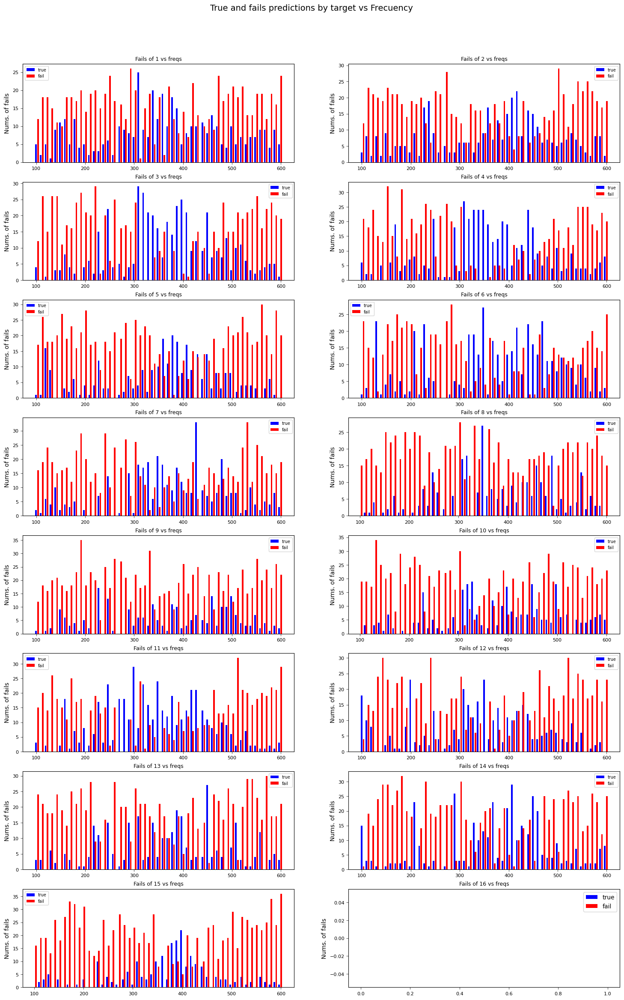

In [77]:
ncols = 2
nrows = 8
t = 0
fig, axes = plt.subplots(nrows, ncols, figsize=(18, 28))
for r in range(nrows):
     for c in range(ncols):

        x_fail = X_va_freq[(X_va_freq.true_pred==1) & (X_va_freq.target == t)]['freq'].apply(lambda x: np.sum([x, -2]))
        counts_f, bins_f = np.histogram(x_fail, bins=3*len(lst_freq))
        _ =  axes[r ,c].hist(bins_f[:-1], bins_f, weights=counts_f, histtype='bar', label="true", color="blue")
        
        x_total = X_va_freq[(X_va_freq.true_pred==0) & (X_va_freq.target == t)]['freq'].apply(lambda x: np.sum([x, +2]))
        counts_t, bins_t = np.histogram(x_total, bins=3*len(lst_freq))
        _ =  axes[r ,c].hist(bins_t[:-1], bins_t, weights=counts_t, histtype='bar', label="fail", color="red")
         
        t = t +1
        axes[r ,c].legend(fontsize="x-small")
        axes[r, c].set_ylabel('Nums. of fails')
        axes[r, c].set_title(f'Fails of {t} vs freqs',fontsize=9)
        axes[r, c].tick_params(labelsize=8, width=0.5)
        axes[r, c].xaxis.offsetText.set_fontsize(6)
        axes[r, c].yaxis.offsetText.set_fontsize(6)
plt.suptitle(f"True and fails predictions by target vs Frecuency", y=0.93,fontsize=14)
plt.legend()
plt.show()           


**Insights**:
* The material that is detected with the highest accuracy can now be identified: Type 3, 4, 11, 12, and 14 at various frequencies, type 8 and 15 at 350, type 13 at 250.
* The material with the lowest accuracy can now be identified, type 2 and 9 show failures at all frequencies.